<div class="alert alert-block alert-warning">
<b>Important note: Some changes have been made to the original files in later notebooks, do not re-run or the data will not match up.
    
In order to run this notebook, please start your jupyter notebook via terminal with this code:    </b>
jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000
</div>

## 2.0 Exploratory Data Analysis

After sorting and extraction, our data sizes has changed. We will need to explore the data further to gain a better understanding of what is left for our use.

### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
# import seaborn as sns
import skimage 
import cv2
import glob
import io
import os

# from autocrop import Cropper
# from PIL import Image
# from scipy import stats
# from skimage.feature import Cascade
from skimage.filters import try_all_threshold
# from skimage.transform import rotate, rescale
# from skimage.util import random_noise
from skimage import exposure, data, color, io, filters
from shutil import copyfile



plt.style.use('fast')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### Defined Functions

In [2]:
def image_to_df(path_in):
    """converts images to df format in df_images"""
    
    #nested function to append file values to list for input into df
    def append_to_list(paths, emotion_type, dataset_name):
        folder = os.listdir(paths)
        for file in folder:
            if file == '.DS_Store':
                pass
            else:
                file_name.append(file.split('.')[0])
                img_ext.append(file.split('.')[1])
                full_name.append(file)
                emotion.append(emotion_type)
                dataset.append(dataset_name)
                image_x = plt.imread(paths+"/"+file)
                image_data.append(image_x)
                image_height.append(image_x.shape[0])
                image_width.append(image_x.shape[1])
                image_pixel.append(image_x.shape[0] * image_x.shape[1])
                try:
                    image_channel.append(image_x.shape[2])
                except:
                    image_channel.append(1)


    #list for input into df
    file_name = []
    img_ext = []
    full_name = []
    emotion = []
    dataset = []
    image_data = []
    image_height = []
    image_width = []
    image_pixel = []
    image_channel = []

    #loops through all folders to get data
    for lists in path_in:
        for paths in lists:
            
            #identify CK+ folder
            if paths[12] == "C":   
                if paths[-5] == "a":
                    append_to_list(paths, "angry", "CK+")
                elif paths[-5] == "h":
                    append_to_list(paths, "happy", "CK+")                
                elif paths[-7] == "n":
                    append_to_list(paths, "neutral", "CK+")                   
                elif paths[-7] == "s":
                    append_to_list(paths, "sad", "CK+") 
                    
            #identify fer2013 folder
            elif paths[12] == "f":
                if paths[-5] == "a":
                    append_to_list(paths, "angry", "fer2013")
                elif paths[-5] == "h":
                    append_to_list(paths, "happy", "fer2013")                
                elif paths[-5] == "u":
                    append_to_list(paths, "neutral", "fer2013")                   
                elif paths[-3] == "s":
                    append_to_list(paths, "sad", "fer2013")
                    
            #identify KDEF folder
            elif paths[12] == "K":
                if paths[-5] == "a":
                    append_to_list(paths, "angry", "KDEF")
                elif paths[-5] == "h":
                    append_to_list(paths, "happy", "KDEF")                
                elif paths[-7] == "n":
                    append_to_list(paths, "neutral", "KDEF")                   
                elif paths[-3] == "s":
                    append_to_list(paths, "sad", "KDEF") 
                    
            #identify GENKI-4K folder
            elif paths[12] == "g":
                if paths[20] == "s":
                    append_to_list(paths, "happy", "GENKI-4K")
                elif paths[20] == "n":
                    append_to_list(paths, "neutral", "GENKI-4K")                
    
    global df_images
    
    #creates df_images
    df_images = pd.DataFrame(list(zip(dataset, emotion, file_name, img_ext, full_name,
                                      image_pixel, image_height, image_width, image_channel, image_data)), 
                       columns =['dataset', 'emotion', 'image_name', 'file_ext','file_name',
                                 'image_pixel', 'image_height', 'image_width', 'image_channels', 'image_data'])

    print("Append to list: Done")

In [3]:
def eda(dataframe):
    """Runs basic EDA on dataframe."""
    print("dataframe shape \n", dataframe.shape, '\n')
    print("dataframe types \n", dataframe.dtypes, '\n')
    print("dataframe describe \n", dataframe.describe(), '\n')
    print("missing values \n", dataframe.isnull().sum(), '\n')
    print("dataframe columns \n", dataframe.columns, '\n')
    
    
#un-comment if need to use:    
#     print("dataframe describe \n", dataframe.describe(exclude=np.number).T, '\n')   
#     print("duplicate values \n", dataframe.duplicated().sum(), '\n')    
    #check if column is unique
#     for i in dataframe.columns:
#         print('{} is unique: {}'.format(i, dataframe[i].is_unique))

In [4]:
def read_img(path):
    """ reads in image """
    img = plt.imread(path)
    return img

In [6]:
def show_image(image, image_name, axis='off'):
    """ displays image"""
    plt.imshow(image, cmap="gray")
    plt.title(image_name)
    plt.axis(axis);


In [9]:
def show_plot_hist_bw(image, dataset_name):
    """shows and plots histogram for original and bw version"""
    image_read = read_img(image)
    bw_image = color.rgb2gray(image_read)
    
    #plot
    plt.figure(figsize=(20,5))
    
    plt.subplot(141)
    plt.imshow(image_read, cmap="gray")
    plt.axis('off')
    plt.title(f"{dataset_name} Sample")

    plt.subplot(142)
    channel = image_read
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} Colour Histogram")
    plt.grid()

    plt.subplot(143)
    plt.imshow(bw_image, cmap="gray")
    plt.axis('off')
    plt.title(f"{dataset_name} BW Sample")

    plt.subplot(144)
    grey_channel = bw_image
    plt.hist(grey_channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW Histogram")
    plt.grid();

In [10]:
def show_plot_hist_AE(image, dataset_name):
    """shows and plots histogram for original and CLAHE version"""
    image_read = read_img(image)
    bw_image = color.rgb2gray(image_read)
    
    
    adpt_eq_img1 = exposure.equalize_adapthist(bw_image, clip_limit=0.01)
    adpt_eq_img2 = exposure.equalize_adapthist(bw_image, clip_limit=0.03)
    adpt_eq_img3 = exposure.equalize_adapthist(bw_image, clip_limit=0.05)
    adpt_eq_img4 = exposure.equalize_adapthist(bw_image, clip_limit=0.07)

    plt.figure(figsize=(10,20))

    plt.subplot(521)
    show_image(bw_image, "Original")
    plt.subplot(522)
    channel = bw_image
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW Histogram")
    plt.grid()

    plt.subplot(523)
    show_image(adpt_eq_img1, "Adaptive Exposure (0.1)")
    plt.subplot(524)
    channel = adpt_eq_img1
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-AE 0.1 Histogram")
    plt.grid()

    plt.subplot(525)
    show_image(adpt_eq_img2, "Adaptive Exposure (0.3)")
    plt.subplot(526)
    channel = adpt_eq_img2
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-AE 0.3  Histogram")
    plt.grid()

    plt.subplot(527)
    show_image(adpt_eq_img3, "Adaptive Exposure (0.5)")
    plt.subplot(528)
    channel = adpt_eq_img3
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-AE 0.5  Histogram")
    plt.grid()

    plt.subplot(529)
    show_image(adpt_eq_img4, "Adaptive Exposure (0.7)")
    plt.subplot(5,2,10)
    channel = adpt_eq_img4
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-AE 0.7  Histogram")
    plt.grid()

In [11]:
def show_plot_hist_sum(image, dataset_name):
    """shows and plots histogram for original and CLAHE version"""
    image_read = read_img(image)
    bw_image = color.rgb2gray(image_read)

    #equalise (e)
    eq_img = exposure.equalize_hist(bw_image)

    #adaptive exposure (ae)
    adpt_eq_img = exposure.equalize_adapthist(bw_image, clip_limit=0.03)

    #e+ae
    eae_img = exposure.equalize_hist(adpt_eq_img)

    #ae+e
    aee_img = exposure.equalize_adapthist(eq_img, clip_limit=0.03)



    plt.figure(figsize=(10,20))

    plt.subplot(521)
    show_image(bw_image, "Original")
    plt.subplot(522)
    channel = bw_image
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW Histogram")
    plt.grid()

    plt.subplot(523)
    show_image(eq_img, "Equalized Image")
    plt.subplot(524)
    channel = eq_img
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-EQ Histogram")
    plt.grid()

    plt.subplot(525)
    show_image(adpt_eq_img, "Adaptive Exposure (0.3)")
    plt.subplot(526)
    channel = adpt_eq_img
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} BW-AE 0.03 Histogram")
    plt.grid()

    plt.subplot(527)
    show_image(eae_img, "Equalized (Adaptive Exposure (0.3))")
    plt.subplot(528)
    channel = eae_img
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} E-AE 0.03 Histogram")
    plt.grid()

    plt.subplot(529)
    show_image(aee_img, "Adaptive Exposure (0.3)(Equalized)")
    plt.subplot(5,2,10)
    channel = aee_img
    plt.hist(channel.ravel(), bins=256, color="darkslategrey")
    plt.title(f"{dataset_name} AE-E 0.03 Histogram")
    plt.grid()

In [12]:
def stack_four(array, image_name):
    plt.figure(figsize=(20,5))
    plot_no = 1
    for path in array:
        img = plt.imread(path)
        plt.subplot(1,4,plot_no)
        plt.imshow(img, cmap="gray")
        plt.title(image_name)
        plt.axis();
        plot_no +=1

### Paths


In [13]:
#enter Image data into df

#CK+ paths
CK_path_a = "../datasets/CK/sorted_set/anger"
CK_path_h = "../datasets/CK/sorted_set/happy"
CK_path_n = "../datasets/CK/sorted_set/neutral"
CK_path_s = "../datasets/CK/sorted_set/sadness"


#fer2013 paths
fer2013_path_a = "../datasets/fer2013/combined/angry"
fer2013_path_h = "../datasets/fer2013/combined/happy"
fer2013_path_n = "../datasets/fer2013/combined/neutral"
fer2013_path_s = "../datasets/fer2013/combined/sad"


#KDEF paths
KDEF_path_a = "../datasets/KDEF/sorted_set/angry"
KDEF_path_h = "../datasets/KDEF/sorted_set/happy"
KDEF_path_n = "../datasets/KDEF/sorted_set/neutral"
KDEF_path_s = "../datasets/KDEF/sorted_set/sad"


#GENKI4K paths
G4_path_h = "../datasets/genki4k/smile"
G4_path_n = "../datasets/genki4k/no_smile"


ck_list = [CK_path_a, CK_path_h, CK_path_n, CK_path_s]
fer_list = [fer2013_path_a, fer2013_path_h, fer2013_path_n, fer2013_path_s]
KDEF_list = [KDEF_path_a, KDEF_path_h, KDEF_path_n, KDEF_path_s]
G4_list = [G4_path_h, G4_path_n]

all_list = [ck_list, fer_list, KDEF_list, G4_list]

In [25]:
#sample view of images

#CK+ paths
CK_path_a1 = sorted(glob.glob("../datasets/CK/sorted_set/anger/*"))
CK_path_h1 = sorted(glob.glob("../datasets/CK/sorted_set/happy/*"))
CK_path_n1 = sorted(glob.glob("../datasets/CK/sorted_set/neutral/*"))
CK_path_s1 = sorted(glob.glob("../datasets/CK/sorted_set/sadness/*"))


#fer2013 paths
fer2013_path_a1 = sorted(glob.glob("../datasets/fer2013/combined/angry/*"))
fer2013_path_h1 = sorted(glob.glob("../datasets/fer2013/combined/happy/*"))
fer2013_path_n1 = sorted(glob.glob("../datasets/fer2013/combined/neutral/*"))
fer2013_path_s1 = sorted(glob.glob("../datasets/fer2013/combined/sad/*"))


#KDEF paths
KDEF_path_a1 = sorted(glob.glob("../datasets/KDEF/sorted_set/angry/*"))
KDEF_path_h1 = sorted(glob.glob("../datasets/KDEF/sorted_set/happy/*"))
KDEF_path_n1 = sorted(glob.glob("../datasets/KDEF/sorted_set/neutral/*"))
KDEF_path_s1 = sorted(glob.glob("../datasets/KDEF/sorted_set/sad/*"))


#GENKI4K paths
G4_path_h1 = sorted(glob.glob("../datasets/genki4k/smile/*"))
G4_path_n1 = sorted(glob.glob("../datasets/genki4k/no_smile/*"))



#list of paths by datasets
ck_list1 = [CK_path_a1, CK_path_h1, CK_path_n1, CK_path_s1]
fer_list1 = [fer2013_path_a1, fer2013_path_h1, fer2013_path_n1, fer2013_path_s1]
KDEF_list1 = [KDEF_path_a1, KDEF_path_h1, KDEF_path_n1, KDEF_path_s1]
G4_list1 = [G4_path_h1, G4_path_n1]



#list of paths by emotions
an_list1 = [CK_path_a1, fer2013_path_a1, KDEF_path_a1]
ha_list1 = [CK_path_h1, fer2013_path_h1, KDEF_path_h1, G4_path_h1]
ne_list1 = [CK_path_n1, fer2013_path_n1, KDEF_path_n1, G4_path_n1]
sa_list1 = [CK_path_s1, fer2013_path_s1, KDEF_path_s1]

***

## 2.1 Datasets

In order to do the explore the data, the four datasets will be combined and passed through a dataframe for further analysis.

In [15]:
#Enter image data for all four datasets into a dataframe
image_to_df(all_list)

Append to list: Done


In [16]:
#saving df to files
df_images.to_csv("../datasets/df_images.csv", index=False)

In [17]:
#info on dataframe
eda(df_images)

dataframe shape 
 (30714, 10) 

dataframe types 
 dataset           object
emotion           object
image_name        object
file_ext          object
file_name         object
image_pixel        int64
image_height       int64
image_width        int64
image_channels     int64
image_data        object
dtype: object 

dataframe describe 
          image_pixel  image_height   image_width  image_channels
count   30714.000000  30714.000000  30714.000000    30714.000000
mean    45521.270268    128.121573    123.192388        1.378394
std    114363.295760    184.559828    170.045697        0.783343
min      2304.000000     48.000000     48.000000        1.000000
25%      2304.000000     48.000000     48.000000        1.000000
50%      2304.000000     48.000000     48.000000        1.000000
75%      2304.000000     48.000000     48.000000        1.000000
max    614010.000000    970.000000    972.000000        3.000000 

missing values 
 dataset           0
emotion           0
image_name        0

<div class="alert alert-block alert-info">
<b>Combined Dataset:</b> 
  
- 30,714 images in total
- image channels range from 1 to 3
- no missing values

    
</div>

In [18]:
#view first 5
df_images.head()

,dataset,emotion,image_name,file_ext,file_name,image_pixel,image_height,image_width,image_channels,image_data
0,CK+,angry,S501_001_00000063,png,S501_001_00000063.png,345600,480,720,3,"[[[0.29803923, 0.27058825, 0.30588236], [1.0, ..."
1,CK+,angry,S034_003_00000025,png,S034_003_00000025.png,313600,490,640,1,"[[0.0, 0.105882354, 0.3764706, 0.6156863, 0.75..."
2,CK+,angry,S042_004_00000015,png,S042_004_00000015.png,313600,490,640,1,"[[0.043137256, 0.28235295, 0.52156866, 0.70588..."
3,CK+,angry,S111_006_00000009,png,S111_006_00000009.png,313600,490,640,1,"[[0.25490198, 0.4509804, 0.6, 0.6862745, 0.752..."
4,CK+,angry,S089_003_00000031,png,S089_003_00000031.png,313600,490,640,1,"[[0.3372549, 0.5254902, 0.67058825, 0.84705883..."


In [19]:
#view last 5
df_images.tail()

,dataset,emotion,image_name,file_ext,file_name,image_pixel,image_height,image_width,image_channels,image_data
30709,GENKI-4K,neutral,file2461,jpg,file2461.jpg,34368,192,179,3,"[[[36, 61, 58], [42, 67, 64], [43, 68, 64], [4..."
30710,GENKI-4K,neutral,file3019,jpg,file3019.jpg,34560,192,180,3,"[[[198, 191, 209], [198, 191, 209], [196, 192,..."
30711,GENKI-4K,neutral,file2307,jpg,file2307.jpg,34560,192,180,3,"[[[48, 35, 29], [42, 29, 23], [38, 25, 19], [3..."
30712,GENKI-4K,neutral,file2313,jpg,file2313.jpg,34368,192,179,3,"[[[109, 100, 83], [109, 100, 83], [109, 100, 8..."
30713,GENKI-4K,neutral,file2475,jpg,file2475.jpg,34368,192,179,3,"[[[217, 239, 252], [223, 245, 255], [232, 252,..."


In [20]:
# to be deleted
df_images.dataset.value_counts()

fer2013     23529
GENKI-4K     4000
KDEF         1679
CK+          1506
Name: dataset, dtype: int64

In [21]:
%%HTML

<div class='tableauPlaceholder' id='viz1596511260733' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Bo&#47;Book1_15962647996450&#47;DatasetsBeforePreprocessing&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='Book1_15962647996450&#47;DatasetsBeforePreprocessing' /><param name='tabs' value='yes' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Bo&#47;Book1_15962647996450&#47;DatasetsBeforePreprocessing&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-GB' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1596511260733');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='100%';vizElement.style.minHeight='650px';vizElement.style.maxHeight=(divElement.offsetWidth*0.75)+'px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='100%';vizElement.style.minHeight='650px';vizElement.style.maxHeight=(divElement.offsetWidth*0.75)+'px';} else { vizElement.style.width='100%';vizElement.style.minHeight='950px';vizElement.style.maxHeight=(divElement.offsetWidth*1.77)+'px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

<div class="alert alert-block alert-info">
<b>Observation:</b> 
    
- a large portion of images come from the FER-2013 set
- most images are formatted as .jpg
- imbalance classes: "happy" making the majority class, which makes up for nearly twice of "angry" or "sad" images, which are now the minority classes 
    
</div>

***

## 2.2 Images

To better understand what we are dealing with, we will now take a look at some of the pictures in our dataset.

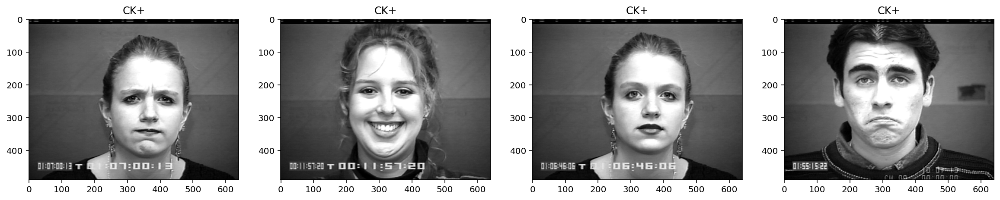

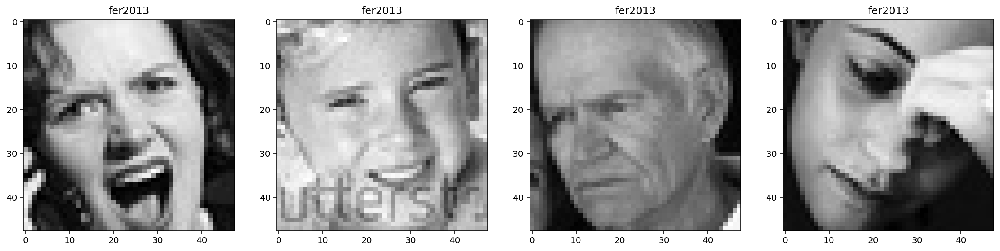

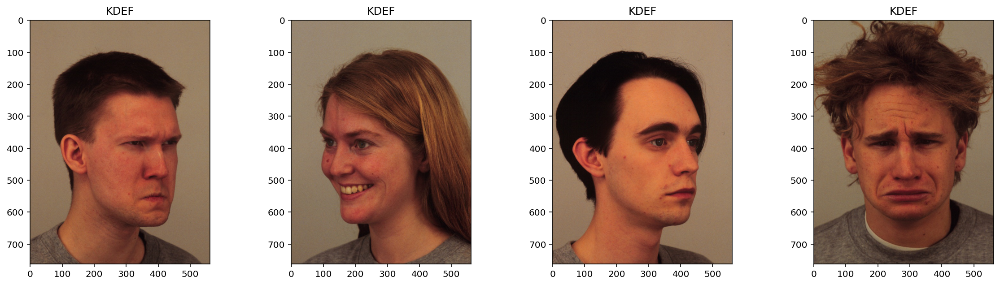

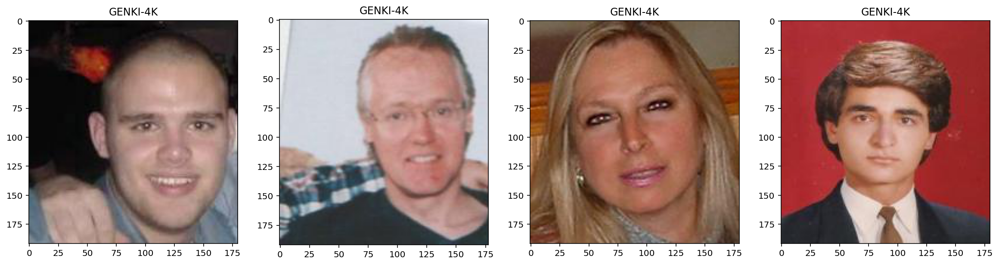

In [26]:
#Sample view of images

#CK+
c1 = CK_path_a1[79]
c2 = CK_path_h1[66]
c3 = CK_path_n1[129]
c4 = CK_path_s1[85]

#fer2013
f1 = fer2013_path_a1[79]
f2 = fer2013_path_h1[66]
f3 = fer2013_path_n1[129]
f4 = fer2013_path_s1[85]

#KDEF
k1 = KDEF_path_a1[79]
k2 = KDEF_path_h1[66]
k3 = KDEF_path_n1[129]
k4 = KDEF_path_s1[85]

#GENKI-4K
g1 = G4_path_h1[79]
g2 = G4_path_h1[66]
g3 = G4_path_n1[129]
g4 = G4_path_n1[85]

stack_four([c1,c2,c3,c4], "CK+")
stack_four([f1,f2,f3,f4], "fer2013")
stack_four([k1,k2,k3,k4], "KDEF")
stack_four([g1,g2,g3,g4], "GENKI-4K")

<div class="alert alert-block alert-info">
<b>Observation:</b> 
    
- all datasets have different sizes of images.
- FER-2013 dataset has images that are face cropped and are lower in size.
</div>

***

## 2.3 Exposure and Contrast

Some datasets have controlled exposures, a majority of our images do not. I will explore the ideal of tweaking thresholds, exposure and contrast to normalize the images. 

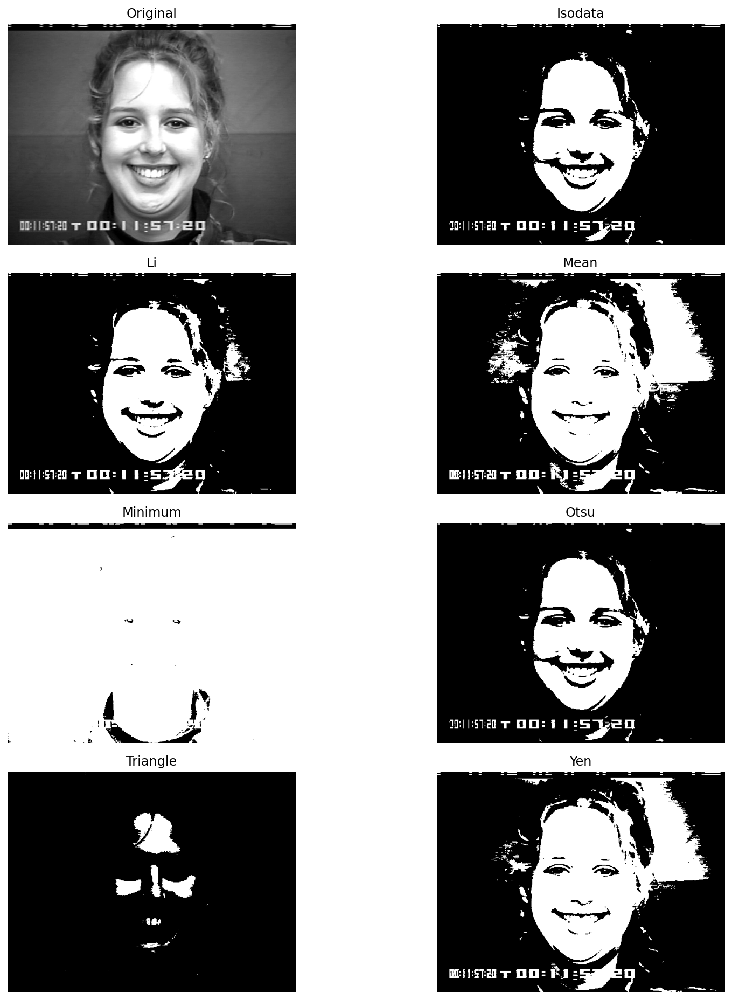

In [27]:
#investigate thresholds
img = read_img(CK_path_h1[66])
bw_image = color.rgb2gray(img)
fig, ax = try_all_threshold(bw_image, verbose=False, figsize=(13,13))
plt.show()

Thresholding seems to remove alot of information from the images, we will try looking at their histogram next.

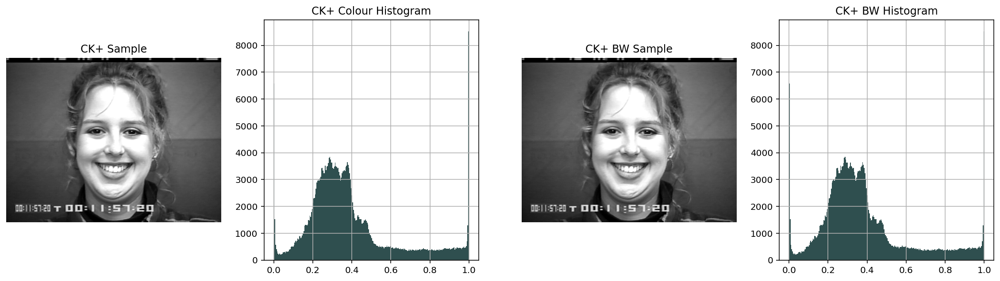

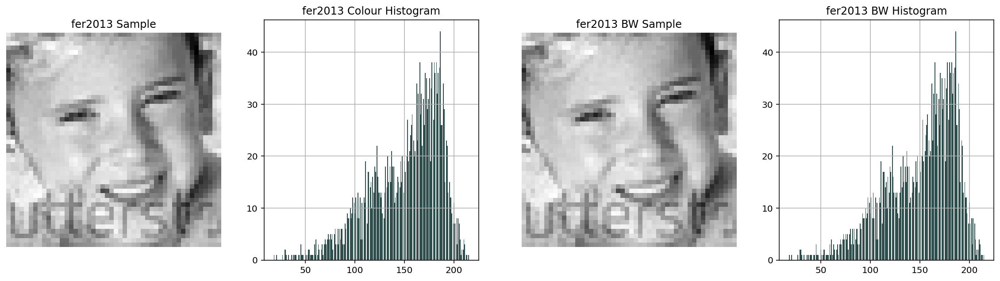

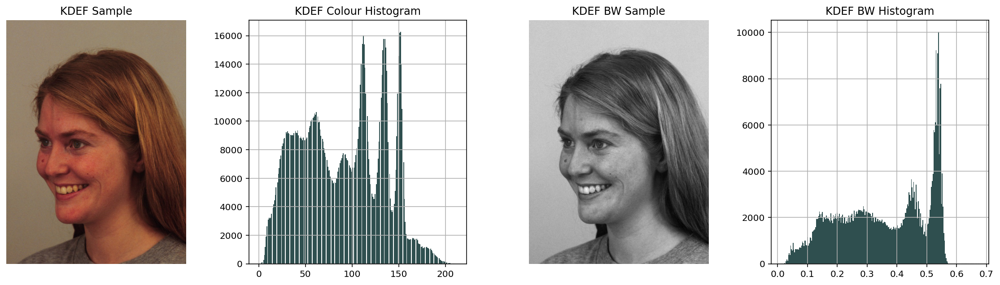

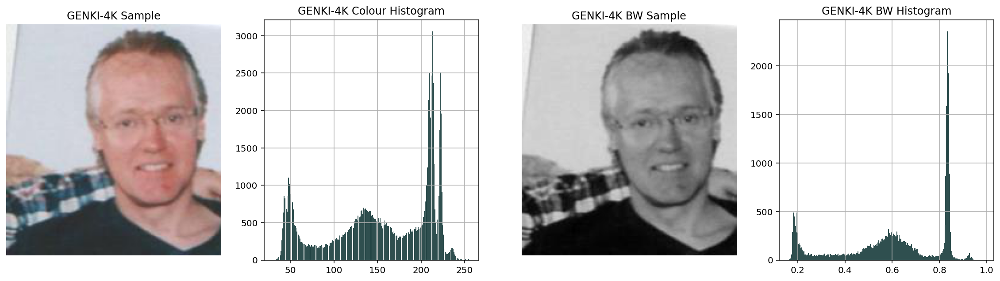

In [28]:
#show and plot histrograms for original and BW versions of images from samples
show_plot_hist_bw(CK_path_h1[66], "CK+")
show_plot_hist_bw(fer2013_path_h1[66], "fer2013")
show_plot_hist_bw(KDEF_path_h1[66], "KDEF")
show_plot_hist_bw(G4_path_h1[66], "GENKI-4K")

We explore Adaptive Exposure for the range of clip-limits

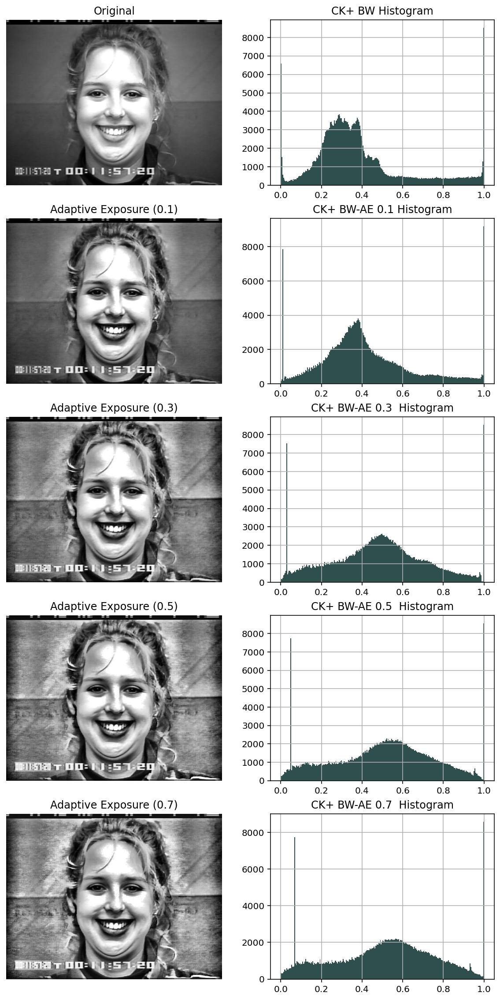

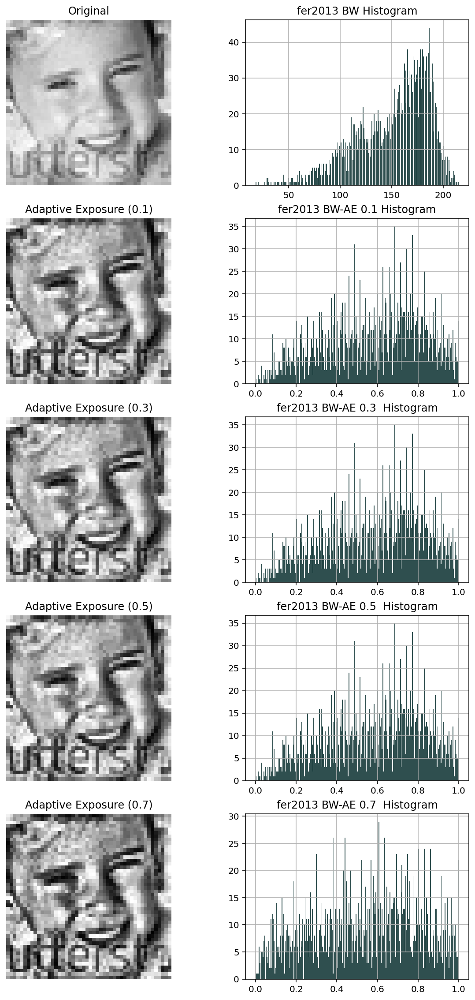

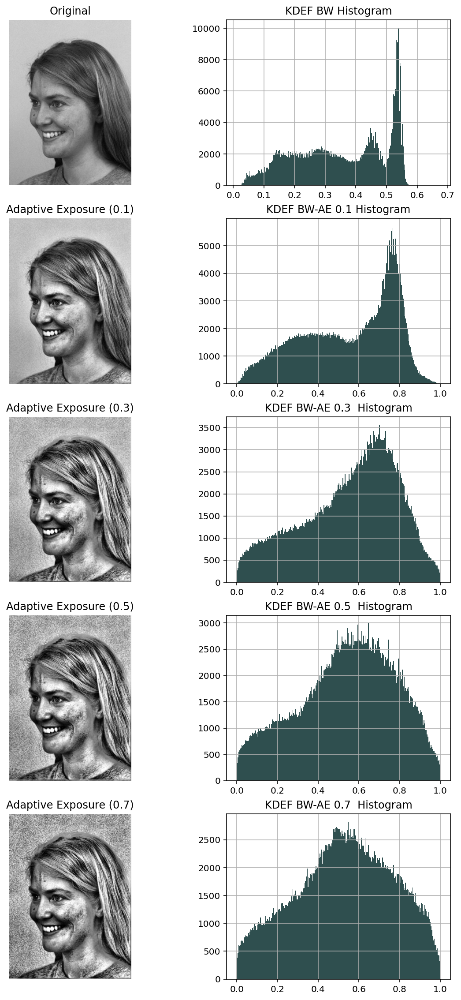

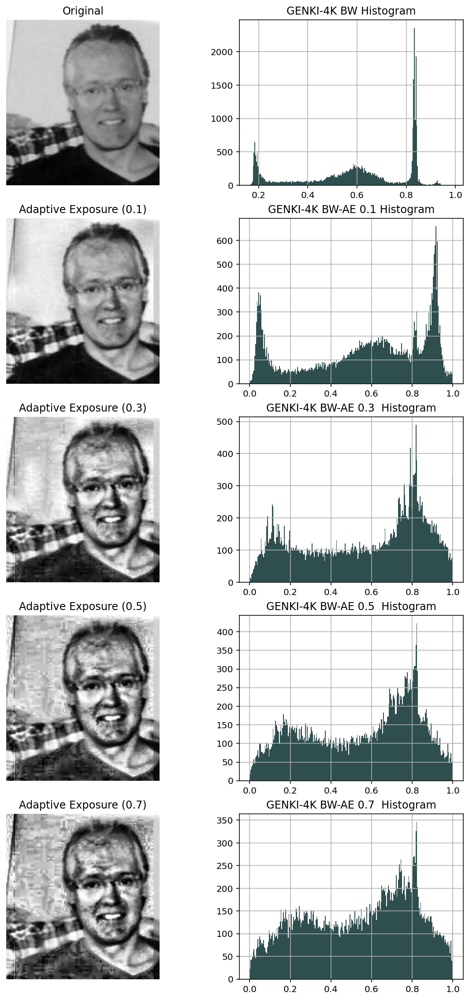

In [29]:
#show and plot histrograms for original and BW-AE versions of images from samples
show_plot_hist_AE(CK_path_h1[66], "CK+")
show_plot_hist_AE(fer2013_path_h1[66], "fer2013")
show_plot_hist_AE(KDEF_path_h1[66], "KDEF")
show_plot_hist_AE(G4_path_h1[66], "GENKI-4K")

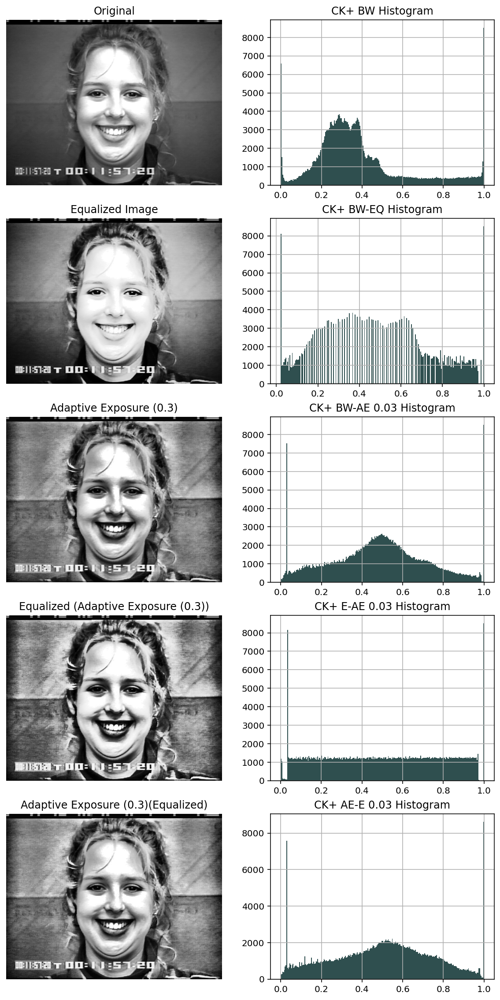

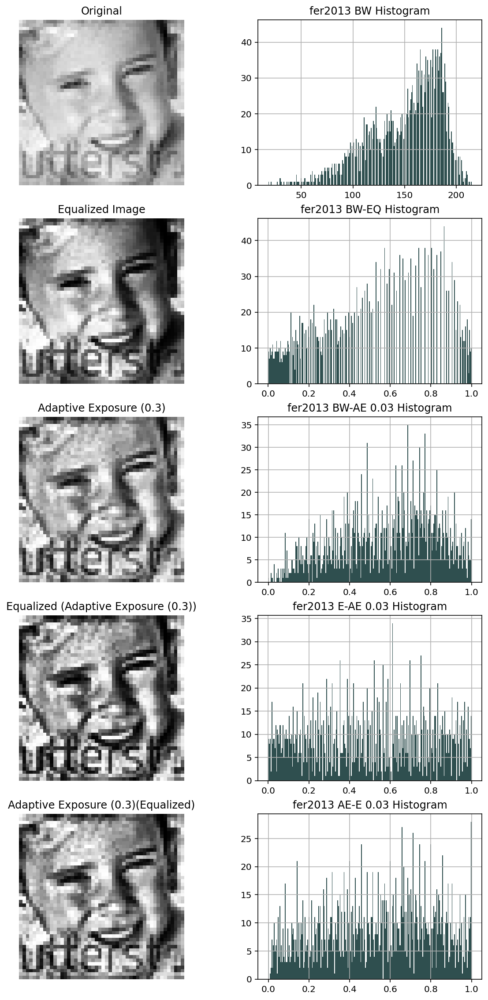

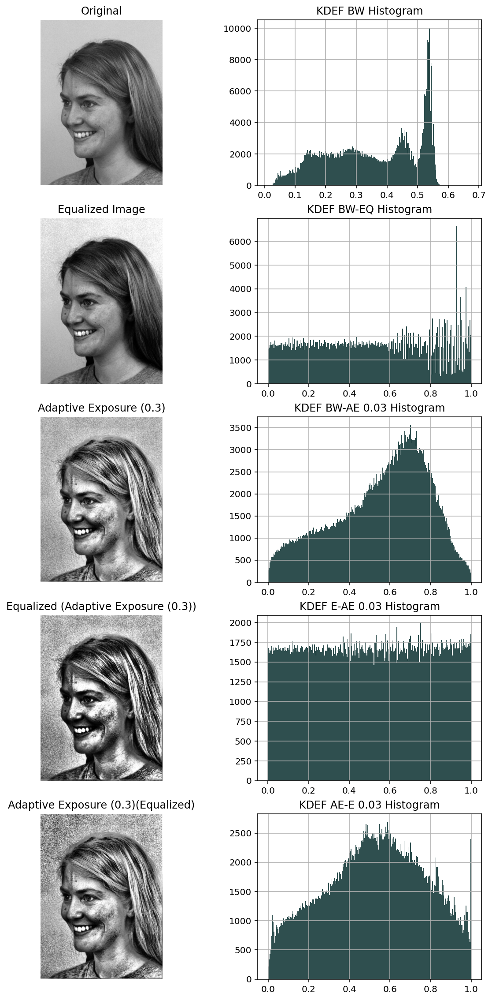

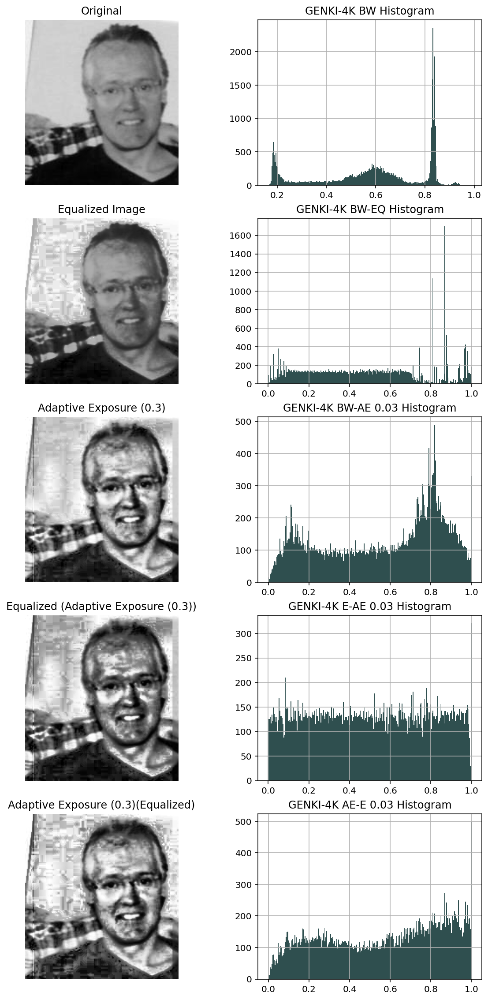

In [30]:
#show and plot histrograms for original and BW-AE-E versions of images from samples
show_plot_hist_sum(CK_path_h1[66], "CK+")
show_plot_hist_sum(fer2013_path_h1[66], "fer2013")
show_plot_hist_sum(KDEF_path_h1[66], "KDEF")
show_plot_hist_sum(G4_path_h1[66], "GENKI-4K")

<div class="alert alert-block alert-info">
<b>Exposure and Equalization:</b> The filters seem to have an effect on flattening or normalising the shade distribution. 
    
For my model, I will try the original and below images + effects for the best dataset for my model:
1. Original
2. Adaptive Exposure (0.3)
3. Adaptive Exposure then Equalized
4. Equalized
5. Equalized then Adaptive Exposure
    